# Objetivo

Com os dados da simulação TEP prontos, vamos agora treinar um _Autoencoder_ com a simulação benigna (48h de operação simulados) e dados de ataque DoS no canal de comunicação entre atuadores e planta. Depois, também treinaremos um _LSTM-Autoencoder_, onde compararemos os resultados.

## Resumo Teórico & Intuição

### Autoencoder (AE)

Ideia: treinar uma rede `𝑓𝜃(⋅)` para reconstruir janelas de sinais normais. Em dados benignos, o erro de reconstrução `∥𝑥−𝑥^∥` é baixo; sob DoS (ou outra anomalia), sobe — e usamos esse erro como score de anomalia. Isso é clássico em DL para representações não supervisionadas e detecção por reconstrução (AEs aprendem representações comprimidas que preservam a estrutura dos dados).

_Arquitetura típica para séries multivariadas (estática por janela)_:
Entrada `𝑥∈𝑅^(𝑊×𝑑)` (janela com `𝑊` amostras e `𝑑` variáveis) é “achatada” e passa por um encoder (camadas densas com não-linearidades) até um bottleneck `𝑧`; o decoder tenta reconstruir `x_hat`.

**Loss**: MSE (ou MAE) sobre a janela:
```
𝐿(𝜃)=1𝑁∑_(𝑖=1)^(𝑁) ∥𝑥𝑖−𝑥^𝑖∥2
```

**Por que funciona?** O AE “memoriza” a variedade (_manifold_) do comportamento nominal; padrões fora desta (ex.: quedas de pacote que congelam `u_hat`,`y`) têm projeções ruins no espaço comprimido → erro alto (evidência em ICS: AEs/LSTM-AEs detectam ataques e falhas no tempo com boa AUC em bancos como SWaT/TEP.

**Métricas recomendadas**: AUC-ROC / AUC-PR; F1 no melhor limiar; detection delay (amostras entre o início do ataque e o primeiro alarme). Para limiar, use: percentil do erro em treino (ex.: 99,5º), ou escolha por ROC no dev set (benigno+ataque), ou ainda ajuste de cauda (EVT) se quiser algo mais estatístico.

### LSTM-Autoencoder — por que e como

_Motivação_: AEs densos não modelam dependências temporais. LSTMs são RNNs que lidam com dependências de longo prazo. _Como_: AEs densos “olham” a janela como um vetor. LSTM-AE modela ordem temporal explicitamente: um LSTM encoder processa a sequência e gera `ℎ𝑇` (representação). Um LSTM decoder tenta reproduzir a sequência original passo a passo a partir desse estado. LSTMs resolvem o problema de longo prazo em RNNs via portas de esquecimento/entrada/saída (formulação original de LSTM) . O uso de LSTM-AE para detecção de anomalias multissensores é bem estabelecido.

**Equações (resumo)**: para `𝑡=1..𝑊`,
(`ℎ𝑡,𝑐𝑡`) =LSTM(`𝑥𝑡,ℎ𝑡−1,𝑐𝑡−1`)

**Decoder**: inicializa com (`ℎ𝑇,𝑐𝑇`) e gera `𝑥^𝑡`

**Loss**: MSE sequência-a-sequência (igual ao AE, mas somada no tempo).

In [1]:
import numpy as np, pandas as pd, torch, torch.nn as nn
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, precision_recall_curve, roc_curve
from sklearn.model_selection import train_test_split
from pathlib import Path

In [2]:
def load_and_clean(path_csv: str, sep: str = ',') -> pd.DataFrame:
    df = pd.read_csv(path_csv, sep=sep)
    const = df.columns[df.std(numeric_only=True).fillna(0) == 0]
    return df.drop(columns=const, errors='ignore')

In [3]:
# ------ TRAINING DATA -------
benign_operation_df = load_and_clean('benign_36h.csv', sep=',')

In [4]:
benign_operation_df.describe()

,t_s,xmv_1,xmv_2,xmv_3,xmv_4,xmv_6,xmv_7,xmv_8,xmv_10,xmv_11,...,res_32,res_33,res_34,res_35,res_36,res_37,res_38,res_39,res_40,res_41
count,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,...,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000
mean,18.000000,62.903221,53.167483,26.293019,60.567876,25.900892,37.220307,46.434501,35.949198,12.343224,...,-0.049081,0.022472,0.042115,-0.052571,0.053684,-0.010271,-0.004274,0.007587,-0.407295,0.757601
std,10.392521,0.093062,0.105523,0.655729,0.098420,1.266611,0.023199,0.020241,0.091317,1.616211,...,0.102401,0.509148,0.068782,0.235276,0.078679,0.009377,0.027837,0.011446,1.361341,1.383373
min,0.000000,62.637052,52.902235,24.147767,60.235951,22.513132,37.146528,46.373010,35.558314,5.773290,...,-0.332606,-1.492116,-0.178523,-0.730434,-0.164669,-0.032968,-0.070428,-0.024973,-3.840778,-3.434934
25%,9.000000,62.844754,53.093738,25.866904,60.503391,25.023390,37.204365,46.421021,35.887313,11.238489,...,-0.117710,-0.324081,-0.003533,-0.195358,0.001484,-0.017040,-0.024368,-0.000536,-1.331988,-0.240365
50%,18.000000,62.906756,53.165774,26.304908,60.563908,25.986763,37.220075,46.434052,35.949274,12.345454,...,-0.042721,0.032090,0.045940,-0.055577,0.057538,-0.010112,-0.003116,0.007227,-0.465586,0.846894
75%,27.000000,62.971000,53.237498,26.726504,60.632985,26.704792,37.235769,46.447539,36.011111,13.443843,...,0.013764,0.363249,0.088038,0.086207,0.110998,-0.003642,0.012821,0.014602,0.537201,1.709566
max,36.000000,63.159015,53.487604,28.221664,60.894786,29.465016,37.299738,46.509645,36.314605,18.872717,...,0.338530,1.669612,0.243584,0.613513,0.240797,0.020236,0.085170,0.039033,3.160792,4.299065


In [5]:
# ============= CONFIG =============
# Window size for the autoencoder
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TS = 0.1               # seu período de amostragem (s)
W = 60                 # janela em amostras (p.ex. 6 s)
STRIDE = 5
BATCH = 256
EPOCHS = 60
LR = 1e-3
SEED = 13
torch.manual_seed(SEED); np.random.seed(SEED)
SUB_MIMO_COLS = [
    'xmeas_7', 'xmeas_12', 'xmeas_36', 'xmv_4', 'xmv_6'
]

In [6]:
# ==== 1) Helpers: janela, normalização e feature selection ====
def make_windows(X, W=60, stride=5):
    """
    Creates windowed stacked input X with W-stride overlay between windows.
    """
    T, d = X.shape
    idx = np.arange(0, T-W+1, stride)
    out = np.stack([X[i:i+W] for i in idx], axis=0)  # [Nwin, W, d]
    return out, idx

def zscore_fit(X):
    """
    Normalizes input X.
    """
    mu, sd = X.mean(axis=0), X.std(axis=0) + 1e-12
    return mu, sd

def zscore_apply(X, mu, sd): return (X - mu)/sd

# seleção canônica de features p/ este problema (apenas resíduos; opcionalmente acrescenta xmeas_ críticos)
def build_features(df: pd.DataFrame, want_inputs_residual=True, add_xmeas=None):
    """
    Retorna (X_df, feat_cols). 
    - Sempre inclui res_y* (se existirem).
    - Se want_inputs_residual=True: inclui res_u* = uhat - xmv. 
      Se uhat_* não existir (benigno), cria res_u* = 0.
    - Nunca inclui gamma_, meta_, t_s, yhat_.
    """
    out = {}

    # 1) resíduos de saída (já existem nos seus CSVs)
    resy_cols = sorted([c for c in df.columns if c.startswith('res_') and not c.startswith('res_u')])
    if resy_cols:
        out.update({c: df[c].astype(np.float32).values for c in resy_cols})

    # 2) resíduo de entrada (uhat - xmv)
    if want_inputs_residual:
        xmv_cols  = sorted([c for c in df.columns if c.startswith('xmv_')])
        uhat_cols = sorted([c for c in df.columns if c.startswith('uhat_')])
        xmv_indexes = [int(xmv_col.split("_")[1]) for xmv_col in xmv_cols]
        # se não houver uhat_ (caso benigno), define res_u = 0
        if xmv_cols:
            for i, c in zip(xmv_indexes, xmv_cols):
                ru_name = f"res_u_{i}"
                if uhat_cols and f'uhat_{i}' in df.columns:
                    out[ru_name] = (df[f'uhat_{i}'] - df[f'xmv_{i}']).astype(np.float32).values
                else:
                    out[ru_name] = np.zeros(len(df), dtype=np.float32)

    # 3) (opcional) anexar xmeas brutas “críticas”
    if add_xmeas:
        for name in add_xmeas:
            if name in df.columns:
                out[name] = df[name].astype(np.float32).values

    X_df = pd.DataFrame(out)

    feat_cols = list(X_df.columns)
    return X_df, feat_cols

# remover colinearidade forte (|rho| >= thr) mantendo o 1º de cada par
def drop_collinear(df: pd.DataFrame, cols: list[str], thr: float = 0.98) -> list[str]:
    C = df[cols].corr(method='spearman').abs()
    print(C)
    upper = C.where(np.triu(np.ones(C.shape), k=1).astype(bool))
    drop = [col for col in upper.columns if any(upper[col] >= thr)]
    keep = [c for c in cols if c not in drop]
    # make sure that all "res_u_" cols are maintained: in training, they're zeros columns
    # and we might inadvertently exclude them here
    res_u_cols = [col for col in cols if col.startswith("res_u_")]

    keep += res_u_cols
    keep = list(set(keep))
    drop = [col for col in drop if col not in res_u_cols]
    return keep, drop

In [7]:
X_df, feat_cols = build_features(benign_operation_df, want_inputs_residual=True, add_xmeas=['xmeas_7','xmeas_12','xmeas_36'])
feat_cols

['res_1',
 'res_10',
 'res_11',
 'res_12',
 'res_13',
 'res_14',
 'res_15',
 'res_16',
 'res_17',
 'res_18',
 'res_19',
 'res_2',
 'res_20',
 'res_21',
 'res_22',
 'res_23',
 'res_24',
 'res_25',
 'res_26',
 'res_27',
 'res_28',
 'res_29',
 'res_3',
 'res_30',
 'res_31',
 'res_32',
 'res_33',
 'res_34',
 'res_35',
 'res_36',
 'res_37',
 'res_38',
 'res_39',
 'res_4',
 'res_40',
 'res_41',
 'res_5',
 'res_6',
 'res_7',
 'res_8',
 'res_9',
 'res_u_1',
 'res_u_10',
 'res_u_11',
 'res_u_2',
 'res_u_3',
 'res_u_4',
 'res_u_6',
 'res_u_7',
 'res_u_8',
 'xmeas_7',
 'xmeas_12',
 'xmeas_36']

In [8]:
feat_cols, dropped = drop_collinear(X_df, feat_cols, thr=0.7)
dropped

             res_1    res_10    res_11    res_12    res_13    res_14  \
res_1     1.000000  0.182291  0.045663  0.492397  0.072359  0.099302   
res_10    0.182291  1.000000  0.738113  0.159100  0.225210  0.504597   
res_11    0.045663  0.738113  1.000000  0.081531  0.040848  0.728807   
res_12    0.492397  0.159100  0.081531  1.000000  0.115831  0.034546   
res_13    0.072359  0.225210  0.040848  0.115831  1.000000  0.082360   
res_14    0.099302  0.504597  0.728807  0.034546  0.082360  1.000000   
res_15    0.065006  0.015857  0.049285  0.025859  0.058054  0.057632   
res_16    0.030431  0.350167  0.248932  0.120392  0.855884  0.255569   
res_17    0.172258  0.142556  0.440622  0.022142  0.085033  0.402092   
res_18    0.015788  0.778379  0.932673  0.094373  0.119232  0.708270   
res_19    0.006993  0.009164  0.025202  0.003113  0.035210  0.000366   
res_2     0.239885  0.930289  0.636443  0.165216  0.109373  0.392435   
res_20    0.067591  0.801918  0.787938  0.091768  0.055699  0.55

['res_11',
 'res_14',
 'res_16',
 'res_18',
 'res_2',
 'res_20',
 'res_21',
 'res_22',
 'res_24',
 'res_26',
 'res_27',
 'res_28',
 'res_3',
 'res_30',
 'res_33',
 'res_34',
 'res_35',
 'res_36',
 'res_38',
 'res_40',
 'res_41',
 'res_7',
 'xmeas_7',
 'xmeas_12']

In [9]:
feat_cols

['res_u_4',
 'res_u_2',
 'res_32',
 'res_4',
 'res_5',
 'res_u_6',
 'res_15',
 'res_u_8',
 'res_10',
 'res_23',
 'res_u_3',
 'res_25',
 'res_1',
 'res_u_11',
 'res_u_7',
 'xmeas_36',
 'res_u_1',
 'res_6',
 'res_37',
 'res_29',
 'res_39',
 'res_9',
 'res_12',
 'res_31',
 'res_u_10',
 'res_13',
 'res_8',
 'res_17',
 'res_19']

In [10]:
X_df[feat_cols].describe()

,res_u_4,res_u_2,res_32,res_4,res_5,res_u_6,res_15,res_u_8,res_10,res_23,...,res_29,res_39,res_9,res_12,res_31,res_u_10,res_13,res_8,res_17,res_19
count,72001.0,72001.0,72001.000000,72001.000000,72001.000000,72001.0,72001.000000,72001.0,72001.000000,72001.000000,...,72001.000000,72001.000000,72001.000000,72001.000000,72001.000000,72001.0,72001.000000,72001.000000,72001.000000,72001.000000
mean,0.0,0.0,-0.049081,-0.024169,0.001440,0.0,0.341963,0.0,0.004929,-0.088475,...,0.121382,0.007587,-0.000119,0.435522,0.049511,0.0,-0.156109,-0.058707,-0.057317,0.075214
std,0.0,0.0,0.102401,0.064997,0.228574,0.0,1.045130,0.0,0.013517,0.256003,...,0.273897,0.011446,0.010869,1.196684,0.276870,0.0,1.033549,0.508438,0.148189,3.815554
min,0.0,0.0,-0.332606,-0.291069,-0.882216,0.0,-4.033466,0.0,-0.128349,-0.805271,...,-0.713315,-0.024973,-0.041694,-4.187134,-0.782297,0.0,-7.968626,-2.205151,-0.664879,-16.146036
25%,0.0,0.0,-0.117710,-0.068029,-0.153641,0.0,-0.370180,0.0,-0.003964,-0.264584,...,-0.074760,-0.000536,-0.007530,-0.386255,-0.140561,0.0,-0.837270,-0.404874,-0.158713,-2.530649
50%,0.0,0.0,-0.042721,-0.024307,0.003279,0.0,0.338056,0.0,0.005715,-0.077285,...,0.113125,0.007227,-0.000122,0.428728,0.065827,0.0,-0.126219,-0.058551,-0.059743,0.072330
75%,0.0,0.0,0.013764,0.020014,0.157946,0.0,1.053141,0.0,0.013556,0.083664,...,0.306542,0.014602,0.007274,1.239092,0.246942,0.0,0.558883,0.286699,0.042055,2.671857
max,0.0,0.0,0.338530,0.241629,0.894212,0.0,4.822470,0.0,0.050163,0.676606,...,0.931205,0.039033,0.041035,5.487990,0.943072,0.0,3.883568,2.106622,0.604135,17.092409


In [11]:
# ==== 2) Montando dataset ====
Xb = X_df[feat_cols].values.astype(np.float32)
mu, sd = zscore_fit(Xb)

In [12]:
Xb_n = zscore_apply(Xb, mu, sd) # Normalized
Xb_win, _ = make_windows(Xb_n, W, STRIDE)          # [N, W, d]

In [13]:
Xb_win.shape

(14389, 60, 29)

In [14]:
# Split train/test (só benigno)
N = len(Xb_win)
idx = np.arange(N); tr, test = train_test_split(idx, test_size=0.2, shuffle=False) # temporal
Xtr = torch.tensor(Xb_win[tr], device=DEVICE)
Xtest = torch.tensor(Xb_win[test], device=DEVICE)

In [15]:
# ==== 3A) AE denso (janela achatada) ====
class AE(nn.Module):
    def __init__(self, W, d, z=16):
        super().__init__()
        D = W*d
        self.enc = nn.Sequential(
            nn.Linear(D, 256), nn.ReLU(),
            nn.Linear(256, 64), nn.ReLU(),
            nn.Linear(64, z),
        )
        self.dec = nn.Sequential(
            nn.Linear(z, 64), nn.ReLU(),
            nn.Linear(64, 256), nn.ReLU(),
            nn.Linear(256, D),
        )
        self.W, self.d = W, d
    def forward(self, x):        # x: [B, W, d]
        B = x.size(0)
        h = self.enc(x.reshape(B, -1))
        y = self.dec(h).reshape(B, self.W, self.d)  # Use reshape instead of view
        return y

In [16]:
# ==== 3B) LSTM-AE ====
class LSTMAE(nn.Module):
    def __init__(self, d, h=64, L=1):
        super().__init__()
        self.enc = nn.LSTM(input_size=d, hidden_size=h, num_layers=L, batch_first=True)
        self.dec = nn.LSTM(input_size=d, hidden_size=h, num_layers=L, batch_first=True)
        self.out = nn.Linear(h, d)
        self.h, self.L = h, L
    def forward(self, x):        # x: [B, W, d]
        B,W,_ = x.size()
        _, (hT, cT) = self.enc(x)                # usa o estado final
        z0 = torch.zeros(B, W, x.size(2), device=x.device) # teacher-forcing "zeros"
        y, _ = self.dec(z0, (hT, cT))
        y = self.out(y)
        return y

In [17]:
def train_model(model, Xtr, Xtest, epochs=60, batch=BATCH, lr=LR):
    model = model.to(DEVICE)
    opt = torch.optim.Adam(model.parameters(), lr=lr)
    crit = nn.MSELoss()
    def run_epoch(X, train=True):
        model.train(train)
        tot, n = 0.0, 0
        for i in range(0, len(X), batch):
            xb = X[i:i+batch]
            yb = model(xb)
            loss = crit(yb, xb)
            if train:
                opt.zero_grad(); loss.backward(); opt.step()
            tot += loss.item()*len(xb); n += len(xb)
        return tot/n
    for ep in range(1, epochs+1):
        trL = run_epoch(Xtr, True)
        testL = run_epoch(Xtest, False)
        if ep%10==0 or ep==1:
            print(f"[{ep:03d}] train {trL:.4f}  test {testL:.4f}")
    return model

In [18]:
# ==== 4) Treinar ====
ae = AE(W, Xtr.shape[2], z=16)
ae = train_model(ae, Xtr, Xtest, EPOCHS)

[001] train 0.6602  test 0.6409
[010] train 0.3550  test 0.4208
[020] train 0.3345  test 0.4298
[030] train 0.3048  test 0.3618
[040] train 0.3042  test 0.3739
[050] train 0.2944  test 0.3632
[060] train 0.3011  test 0.3765


In [19]:
lstm = LSTMAE(Xtr.shape[2], h=64, L=1)
lstm = train_model(lstm, Xtr, Xtest, EPOCHS)

[001] train 0.6875  test 0.7162
[010] train 0.4516  test 0.4914
[020] train 0.3310  test 0.3619
[030] train 0.2982  test 0.3202
[040] train 0.2881  test 0.3050
[050] train 0.2841  test 0.2984
[060] train 0.2785  test 0.2905


In [20]:
# ==== 5) Funções de score e limiar ====
@torch.no_grad()
def recon_error(model, X):
    """
    Retorna o erro de reconstrução por janela.
    Erro de reconstrução: MSE por janela.
    """
    model.eval()
    E = []
    for i in range(0, len(X), BATCH):
        xb = X[i:i+BATCH]
        yb = model(xb)
        err = ((yb - xb)**2).mean(dim=(1,2))   # MSE por janela
        E.append(err.detach().cpu().numpy())
    return np.concatenate(E)

Etr_ae   = recon_error(ae, Xtr).ravel()
thr_ae   = np.quantile(Etr_ae, 0.995)   # 99.5º percentil
print("THR_AE  :", float(thr_ae))

THR_AE  : 0.5512121319770813


In [21]:
Etr_lstm = recon_error(lstm, Xtr).ravel()
thr_lstm = np.quantile(Etr_lstm, 0.995)
print("THR_LSTM:", float(thr_lstm))

THR_LSTM: 0.40865612030029297


In [22]:
# ==== util: faz y_win a partir de gamma_* ====
def window_labels_from_gamma(df, W, idx0, prefix="gamma_", mode="frac", tau=0.1):
    """
    mode="any"       : [Nwin] -> 1 se houve >=1 drop em qualquer canal/instante
    mode="frac"      : [Nwin] -> 1 se fração média de drop (tempo×canais) >= tau
    mode="perch_any" : [Nwin,C] -> por canal, 1 se houve >=1 drop no canal
    mode="perch_frac": [Nwin,C] -> por canal, 1 se frac_de_drop(canal) >= tau
    """
    G = df.filter(like=prefix).to_numpy(dtype=float)  # 1=entrega, 0=drop
    if G.size == 0:
        return None
    D = 1.0 - G  # 1=drop

    if mode == "any":
        y = (D.sum(axis=1) > 0).astype(int)
        return np.array([y[i:i+W].max() for i in idx0], dtype=int)

    if mode == "frac":
        y_win = []
        for i in idx0:
            slab = D[i:i+W, :]            # [W,C]
            y_win.append(1 if slab.mean() >= tau else 0)
        return np.array(y_win, dtype=int)

    if mode == "perch_any":
        Y = []
        for i in idx0:
            slab = D[i:i+W, :]            # [W,C]
            Y.append((slab.max(axis=0) > 0).astype(int))
        return np.stack(Y, axis=0)        # [Nwin,C]

    if mode == "perch_frac":
        Y = []
        for i in idx0:
            slab = D[i:i+W, :]            # [W,C]
            frac_c = slab.mean(axis=0)    # [C]
            Y.append((frac_c >= tau).astype(int))
        return np.stack(Y, axis=0)

    raise ValueError("mode inválido")


def safe_make_labels(df, W, idx0, prefer="frac", tau=0.1):
    """
    Para 'frac' e 'any', tenta evitar monoclasse ajustando tau e/ou caindo em 'any'.
    Para 'perch_*', retorna sempre a matriz [Nwin,C] (sem fallback).
    """
    has_gamma = any(df.columns.str.startswith("gamma_"))
    if not has_gamma:
        return None, prefer, tau

    if prefer in ("perch_any","perch_frac"):
        Y = window_labels_from_gamma(df, W, idx0, mode=prefer, tau=tau)
        return Y, prefer, tau

    # Modos globais
    Y = window_labels_from_gamma(df, W, idx0, mode=prefer, tau=tau)
    if Y is not None and len(np.unique(Y)) < 2:
        # tente outros taus
        for t in [0.03, 0.05, 0.1, 0.2, 0.3, 0.5]:
            Y = window_labels_from_gamma(df, W, idx0, mode="frac", tau=t)
            if len(np.unique(Y)) > 1:
                return Y, "frac", t
        # último recurso: 'any'
        Y = window_labels_from_gamma(df, W, idx0, mode="any")
        return Y, "any", None
    return Y, prefer, tau

def bincount_report(y):
    u, c = np.unique(y, return_counts=True)
    return dict(zip(u.tolist(), c.tolist()))

In [23]:
def debug_drop_stats(df, W=60, prefix="gamma_"):
    G = df.filter(like=prefix).to_numpy(float)
    if G.size == 0:
        print("sem gamma_* no CSV"); return
    D = 1.0 - G
    # taxa de drop instantânea agregada nos canais:
    inst_frac = D.mean(axis=1)            # [T]
    print("inst_frac min/mean/median/max:",
          np.min(inst_frac), np.mean(inst_frac), np.median(inst_frac), np.max(inst_frac))
    # com PER_CHANNEL=off, as colunas de G tendem a ser idênticas:
    print("corr entre canais (amostra):",
          np.corrcoef(G[:1000].T).round(3))


In [24]:
def _best_f1(y_true, scores):
    p, r, thr = precision_recall_curve(y_true, scores)
    f1 = 2*p*r/(p+r+1e-12)
    return float(np.nanmax(f1))

def _f1_at(y_true, yhat):
    tp = ((yhat==1)&(y_true==1)).sum()
    fp = ((yhat==1)&(y_true==0)).sum()
    fn = ((yhat==0)&(y_true==1)).sum()
    prec = tp/(tp+fp+1e-12); rec = tp/(tp+fn+1e-12)
    return float(2*prec*rec/(prec+rec+1e-12))

def _safe_auc_ap(y_true, scores):
    # retorna (auc, ap) com np.nan se monoclasse
    if len(np.unique(y_true)) < 2:
        print(f"y_true possui classe única, y_true_i == {np.unique(y_true)}!")
        return np.nan, np.nan
    return (float(roc_auc_score(y_true, scores)),
            float(average_precision_score(y_true, scores)))

In [25]:
def evaluate_on_path(csv_path: str | pd.DataFrame,
                     feat_cols: list,
                     mu: np.ndarray, sd: np.ndarray,
                     ae_model, lstm_model,
                     W=60, stride=5,
                     thr_ae_tr=None, thr_lstm_tr=None,
                     label_mode: str = "frac",  # "frac" | "any" | "perch"
                     tau: float = 0.3,
                     attack_only: bool = True):
    """
    - Usa exatamente feat_cols (já definidos no treino).
    - Normaliza com (mu, sd) do treino.
    - Janela, computa erros (AE/LSTM) e aplica limiares do treino.
    - Gera rótulos conforme label_mode:
        "frac": fração média de drops >= tau ⇒ 1
        "any" : qualquer drop na janela ⇒ 1
        "perch": rótulos por canal [Nwin, C]
    - Métricas:
        • "frac"/"any": AUC/AP/F1max/F1@thr (globais)
        • "perch": por canal + agregados macro/micro
    """
    if type(csv_path) is str:
        df = load_and_clean(csv_path, sep=',')
    else:
        df = csv_path.copy()
        
    if attack_only:
        if csv_path.split('_')[3] == 'peroff' and label_mode == 'perch': # PER_CHANNEL no simulink desabilitado; label_mode não pode ser "perch"
            print("Dataset usado com anomalias iguais para todos os canais. Trocando label_mode para frac..")
            label_mode = "frac"

    # Garante res_u_* (se já existirem, nada muda) + quaisquer xmeas extras que quiser
    Xdf, _ = build_features(df, want_inputs_residual=True,
                            add_xmeas=['xmeas_7','xmeas_12','xmeas_36'])
    # Seleção e ordem exata de features
    Xdf = Xdf.reindex(columns=feat_cols, fill_value=0.0)
    X   = Xdf.to_numpy(np.float32)

    # Normalização e janelamento
    Xn      = zscore_apply(X, mu, sd)
    Xw, idx0 = make_windows(Xn, W, stride)
    Xw_t    = torch.tensor(Xw, device=DEVICE)

    # Erros e alarmes
    Ea  = recon_error(ae_model,   Xw_t).ravel()
    El  = recon_error(lstm_model, Xw_t).ravel()
    if thr_ae_tr is None or thr_lstm_tr is None:
        raise ValueError("Passe thr_ae_tr e thr_lstm_tr calculados no treino.")
    yhat_ae   = (Ea > thr_ae_tr).astype(int)
    yhat_lstm = (El > thr_lstm_tr).astype(int)

    # Rótulos
    Y, used_mode, used_tau = safe_make_labels(df, W, idx0, prefer=label_mode, tau=tau)

    print(f"[info] rotulação de y_true usou modo {used_mode} com tau={used_tau}")
    metrics = {}
    if Y is None:
        # sem rótulos -> só devolve scores e alarmes
        return idx0, Ea, El, yhat_ae, yhat_lstm, None, metrics, used_mode, used_tau

    # Caso 1: rótulo binário global (frac/any)
    if used_mode in ("frac","any"):
        y_true = Y.astype(int)
        # AUC/AP
        auc_ae,  ap_ae  = _safe_auc_ap(y_true, Ea)
        auc_lstm, ap_l  = _safe_auc_ap(y_true, El)
        metrics.update(dict(auc_ae=auc_ae, auc_lstm=auc_lstm,
                            ap_ae=ap_ae,   ap_lstm=ap_l))
        # F1@melhor limiar (varre scores)
        metrics["f1max_ae"]   = _best_f1(y_true, Ea)
        metrics["f1max_lstm"] = _best_f1(y_true, El)
        # F1 nos limiares do treino
        metrics["f1thr_ae"]   = _f1_at(y_true, yhat_ae)
        metrics["f1thr_lstm"] = _f1_at(y_true, yhat_lstm)
        return idx0, Ea, El, yhat_ae, yhat_lstm, y_true, metrics, used_mode, used_tau

    # Caso 2: rótulo por canal (perch_) -> calcular por canal e agregados
    if used_mode.startswith("perch_"):
        Yc = Y.astype(int)         # [Nwin, C]
        C  = Yc.shape[1]
        ch_metrics = []
        for c in range(C):
            y_true_c = Yc[:,c]
            auc_ae_c, ap_ae_c   = _safe_auc_ap(y_true_c, Ea)
            auc_lstm_c, ap_l_c  = _safe_auc_ap(y_true_c, El)
            f1max_ae_c   = _best_f1(y_true_c, Ea)
            f1max_lstm_c = _best_f1(y_true_c, El)
            f1thr_ae_c   = _f1_at(y_true_c, yhat_ae)
            f1thr_lstm_c = _f1_at(y_true_c, yhat_lstm)
            ch_metrics.append(dict(
                channel=c+1,
                auc_ae=auc_ae_c, auc_lstm=auc_lstm_c,
                ap_ae=ap_ae_c,   ap_lstm=ap_l_c,
                f1max_ae=f1max_ae_c, f1max_lstm=f1max_lstm_c,
                f1thr_ae=f1thr_ae_c, f1thr_lstm=f1thr_lstm_c
            ))
        # agregados macro (média simples ignorando NaN)
        def _nanmean_dict(keys):
            return {k: float(np.nanmean([m[k] for m in ch_metrics])) for k in keys}
        keys = ["auc_ae","auc_lstm","ap_ae","ap_lstm","f1max_ae","f1max_lstm","f1thr_ae","f1thr_lstm"]
        metrics["macro"] = _nanmean_dict(keys)

        # agregados micro: empilha janelas×canais (cuidado com custo)
        y_true_micro = Yc.reshape(-1)
        Ea_micro     = np.repeat(Ea, C)
        El_micro     = np.repeat(El, C)
        yhat_ae_m    = np.repeat(yhat_ae, C)
        yhat_lstm_m  = np.repeat(yhat_lstm, C)

        auc_ae_m,  ap_ae_m  = _safe_auc_ap(y_true_micro, Ea_micro)
        auc_lstm_m, ap_l_m  = _safe_auc_ap(y_true_micro, El_micro)
        metrics["micro"] = dict(
            auc_ae=auc_ae_m, auc_lstm=auc_lstm_m,
            ap_ae=ap_ae_m,   ap_lstm=ap_l_m,
            f1max_ae=_best_f1(y_true_micro, Ea_micro),
            f1max_lstm=_best_f1(y_true_micro, El_micro),
            f1thr_ae=_f1_at(y_true_micro, yhat_ae_m),
            f1thr_lstm=_f1_at(y_true_micro, yhat_lstm_m),
        )
        metrics["per_channel"] = ch_metrics
        return idx0, Ea, El, yhat_ae, yhat_lstm, Yc, metrics, used_mode, used_tau

    raise ValueError("label_mode inválido")


In [26]:
test_df = load_and_clean("dosB_seed01_p0.20_peron_hold1_12h.csv", sep=',')

In [27]:
debug_drop_stats(test_df)

inst_frac min/mean/median/max: 0.0 0.199248642417677 0.16666666666666666 0.8333333333333334
corr entre canais (amostra): [[ 1.     0.014  0.088  0.013 -0.048 -0.041  0.01   0.032 -0.023  0.009
   0.019 -0.021]
 [ 0.014  1.     0.     0.044  0.012  0.013 -0.025 -0.008 -0.045 -0.047
  -0.003 -0.05 ]
 [ 0.088  0.     1.     0.011 -0.006 -0.022  0.014 -0.044  0.068 -0.03
  -0.07  -0.015]
 [ 0.013  0.044  0.011  1.     0.019  0.018  0.002 -0.001 -0.012  0.045
  -0.    -0.024]
 [-0.048  0.012 -0.006  0.019  1.     0.013 -0.009 -0.017  0.02   0.004
   0.056 -0.004]
 [-0.041  0.013 -0.022  0.018  0.013  1.     0.052 -0.019  0.013 -0.03
  -0.007  0.044]
 [ 0.01  -0.025  0.014  0.002 -0.009  0.052  1.     0.044  0.056  0.053
  -0.016 -0.04 ]
 [ 0.032 -0.008 -0.044 -0.001 -0.017 -0.019  0.044  1.    -0.03  -0.034
   0.012 -0.012]
 [-0.023 -0.045  0.068 -0.012  0.02   0.013  0.056 -0.03   1.     0.009
   0.043 -0.048]
 [ 0.009 -0.047 -0.03   0.045  0.004 -0.03   0.053 -0.034  0.009  1.
   0.027  0

In [28]:
label_mode = "perch_frac"
idx0, Ea, El, yhat_ae, yhat_lstm, y_true, metrics, used_mode, used_tau = evaluate_on_path(
    "dosB_seed01_p0.20_peron_hold1_12h.csv", # 'dosB_seed01_p0.10_peroff_hold1_12h.csv'
    feat_cols=feat_cols, mu=mu, sd=sd, ae_model=ae, lstm_model=lstm,
    W=60, stride=5, thr_ae_tr=thr_ae, thr_lstm_tr=thr_lstm,
    label_mode=label_mode, tau=0.2
)

[info] rotulação de y_true usou modo perch_frac com tau=0.2


In [29]:
used_mode

'perch_frac'

In [30]:
if used_mode.startswith('perch_'):
    # deve bater com p_drop do dataset, aproximadamente, caso seja perch_any:
    print(y_true[:,10].sum())
    print(len(y_true[:,10]))
    print(y_true[:,10].sum() / len(y_true[:,10])) # vai variando o segundo índice de 0 a 11
else:
    print(y_true.sum() / len(y_true))

2612
4789
0.5454165796617247


In [31]:
metrics

{'macro': {'auc_ae': 0.5916655646848452,
  'auc_lstm': 0.5916632147389916,
  'ap_ae': 0.6239862431662003,
  'ap_lstm': 0.6239843182537436,
  'f1max_ae': 0.7128129360332368,
  'f1max_lstm': 0.712848832822373,
  'f1thr_ae': 0.7047204093772196,
  'f1thr_lstm': 0.7047204093772196},
 'micro': {'auc_ae': 0.5913471116635396,
  'auc_lstm': 0.5913448262979104,
  'ap_ae': 0.619046612809686,
  'ap_lstm': 0.6190452689548274,
  'f1max_ae': 0.7052016589253094,
  'f1max_lstm': 0.7052016589253094,
  'f1thr_ae': 0.7050194355243027,
  'f1thr_lstm': 0.7050194355243027},
 'per_channel': [{'channel': 1,
   'auc_ae': 0.7533735446543232,
   'auc_lstm': 0.7533582312825453,
   'ap_ae': 0.7718147901903583,
   'ap_lstm': 0.7717806872495172,
   'f1max_ae': 0.7635273702471848,
   'f1max_lstm': 0.7635273702471848,
   'f1thr_ae': 0.7186622073573988,
   'f1thr_lstm': 0.7186622073573988},
  {'channel': 2,
   'auc_ae': 0.6728292078776144,
   'auc_lstm': 0.6728477855111901,
   'ap_ae': 0.6475124499279932,
   'ap_lstm': 

In [32]:
len(yhat_ae)

4789

In [33]:
yhat_ae.sum()

np.int64(4789)

In [34]:
# DATASET MISTO
def _median_step(t):
    t = np.asarray(t).astype(float)
    if len(t) < 2: return 1.0
    dt = np.median(np.diff(t))
    return float(dt if dt>0 else 1.0)

def _ensure_columns(df, n_ch=12):
    # garante gamma_*, uhat_* e res_u_* (com defaults benígnos se não existirem)
    for j in range(1, n_ch+1):
        g = f"gamma_{j}"
        if g not in df.columns:
            df[g] = 1.0
        uhat = f"uhat_{j}"
        xmv  = f"xmv_{j}"
        resu = f"res_u_{j}"
        if resu not in df.columns:
            if uhat in df.columns and xmv in df.columns:
                df[resu] = df[uhat] - df[xmv]
            else:
                df[resu] = 0.0
        if uhat not in df.columns and xmv in df.columns:
            df[uhat] = df[xmv]  # benigna: uhat=xmv
    return df

def _align_cols_union(dfA, dfB):
    cols = sorted(set(dfA.columns) | set(dfB.columns))
    for df in (dfA, dfB):
        for c in cols:
            if c not in df.columns:
                df[c] = 0.0
        # mesma ordem
        df.drop(columns=[c for c in df.columns if c not in cols], inplace=True)
        df = df.reindex(columns=cols)
    return dfA.reindex(columns=cols), dfB.reindex(columns=cols), cols

def make_mixed_csv(
    benign_path: str,
    attack_path: str,
    out_path: str,
    n_blocks: int = 6,
    block_minutes: tuple = (5, 20),
    seed: int = 123,
    n_channels: int = 12
):
    """
    Monta um CSV misturando blocos de operação benigna e ataque.
    - benign_path: caminho do CSV benigno
    - attack_path: caminho do CSV de ataque
    - out_path: caminho do CSV de saída
    - n_blocks: número máximo de blocos a intercalar
    - block_minutes: tupla (min, max) do tamanho aleatório de cada bloco em minutos
    - seed: semente RNG para reprodutibilidade
    - n_channels: número de canais (para garantir colunas essenciais)
    Retorna (mix_df, out_path)
    """
    rng = np.random.default_rng(seed)
    db = pd.read_csv(benign_path)
    da = pd.read_csv(attack_path)

    # passo temporal típico (adapta se t_s está em horas/segundos)
    dt_b = _median_step(db["t_s"]) if "t_s" in db.columns else 1.0
    dt_a = _median_step(da["t_s"]) if "t_s" in da.columns else 1.0
    dt   = float(np.median([dt_b, dt_a, 1.0]))
    print(f"[info] dt_b={dt_b:.4f}s  dt_a={dt_a:.4f}s  → usando dt={dt:.4f}s")

    # padroniza colunas essenciais
    db = _ensure_columns(db.copy(), n_ch=n_channels)
    da = _ensure_columns(da.copy(), n_ch=n_channels)
    db, da, cols = _align_cols_union(db, da)

    # percorre sequencialmente cada fonte, alternando blocos
    i_b = i_a = 0
    out_chunks = []
    src_next = "benign" if rng.random() < 0.5 else "attack"

    # converte intervalo de minutos em número de linhas
    for k in range(n_blocks):
        L_min = rng.uniform(*block_minutes)
        L_rows = max(100, int(round((L_min*60) / max(dt, 1e-9))))

        if src_next == "benign":
            j = min(i_b + L_rows, len(db))
            if i_b >= len(db):  # acabou benigno → força ataque
                src_next = "attack"; continue
            out_chunks.append(db.iloc[i_b:j].copy())
            i_b = j
            src_next = "attack"
        else:
            j = min(i_a + L_rows, len(da))
            if i_a >= len(da):  # acabou ataque → força benigno
                src_next = "benign"; continue
            out_chunks.append(da.iloc[i_a:j].copy())
            i_a = j
            src_next = "benign"

        # para de alternar se uma das fontes esgotar completamente
        if i_b >= len(db) and i_a >= len(da):
            break

    if not out_chunks:
        raise RuntimeError("Não foi possível montar blocos — aumente n_blocks ou verifique os CSVs.")

    mix = pd.concat(out_chunks, axis=0, ignore_index=True)

    # Recria um t_s contínuo com passo dt
    mix["t_s"] = np.arange(len(mix)) * dt

    # Metadados do mix (opcional)
    mix["meta_is_mixed"] = 1
    mix["meta_dt"] = dt

    Path(out_path).parent.mkdir(parents=True, exist_ok=True)
    mix.to_csv(out_path, index=False)
    return mix, out_path

In [248]:
mixed_df, mixed_path = make_mixed_csv(
    benign_path="benign_36h.csv",
    attack_path="dosB_seed01_p0.20_peron_hold1_12h.csv",
    out_path="mixed_benign_attack.csv",
    n_blocks=8, block_minutes=(6, 18), seed=42, n_channels=12
)
# quanto maior o tau, maior o impacto negativo na performance (mais restritivo para rotular como ataque -> fica mais difícil detectar ataques sutis / + desbalanceado)
# o threshold de performance mínima do tau, dado p_drop = x, é aproximadamente tau ≈ x; para tau > x, muito desbalanceado
# p=0.10: tau(min performance) = 0.10
# p=0.20: tau(min performance) = 0.20
# p=0.30: tau(min performance) = 0.30 (usado no TG: 0.25)
# p=0.40: tau(min performance) = 0.40 (usado no TG: 0.25)

[info] dt_b=0.0005s  dt_a=0.0005s  → usando dt=0.0005s


In [249]:
label_mode = "perch_frac"
idx0, Ea, El, yhat_ae, yhat_lstm, y_true, metrics, used_mode, used_tau = evaluate_on_path(
    mixed_path,
    feat_cols=feat_cols, mu=mu, sd=sd, ae_model=ae, lstm_model=lstm,
    W=60, stride=5, thr_ae_tr=float(thr_ae), thr_lstm_tr=float(thr_lstm),
    label_mode=label_mode, tau=0.2, attack_only=False
)

[info] rotulação de y_true usou modo perch_frac com tau=0.2


In [250]:
if used_mode.startswith('perch_'):
    # deve bater com p_drop do dataset, aproximadamente, caso seja perch_any:
    print(y_true[:,11].sum())
    print(len(y_true[:,11]))
    print(y_true[:,11].sum() / len(y_true[:,11])) # vai variando o segundo índice de 0 a 11
else:
    print(y_true.sum() / len(y_true))

2481
19189
0.12929282401375788


In [251]:
metrics

{'macro': {'auc_ae': 0.9461770248890694,
  'auc_lstm': 0.9461767617633501,
  'ap_ae': 0.6239800341852876,
  'ap_lstm': 0.6239781102989991,
  'f1max_ae': 0.7127989207081972,
  'f1max_lstm': 0.7128348286331428,
  'f1thr_ae': 0.693119095679533,
  'f1thr_lstm': 0.6944110341845606},
 'micro': {'auc_ae': 0.9461927446905708,
  'auc_lstm': 0.9461924441060721,
  'ap_ae': 0.6190132300096927,
  'ap_lstm': 0.6190118867539663,
  'f1max_ae': 0.7050812062327302,
  'f1max_lstm': 0.7050812062327302,
  'f1thr_ae': 0.693412788958464,
  'f1thr_lstm': 0.6947055363816447},
 'per_channel': [{'channel': 1,
   'auc_ae': 0.9685717806943109,
   'auc_lstm': 0.9685698292902725,
   'ap_ae': 0.7718142529484924,
   'ap_lstm': 0.7717801500464041,
   'f1max_ae': 0.7635273702471848,
   'f1max_lstm': 0.7635273702471848,
   'f1thr_ae': 0.7067491119584954,
   'f1thr_lstm': 0.7080532489780582},
  {'channel': 2,
   'auc_ae': 0.9430343928989338,
   'auc_lstm': 0.9430370040760593,
   'ap_ae': 0.6112424602184798,
   'ap_lstm': 

In [252]:
len(yhat_ae)

19189

In [253]:
yhat_ae.sum()

np.int64(4915)

## Gráficos Finais

In [254]:
import matplotlib.pyplot as plt
from sklearn.metrics import auc

def plot_roc_pr(y_true, s1, s2, name1="AE", name2="LSTM-AE"):
    fpr1, tpr1, _ = roc_curve(y_true, s1) if len(np.unique(y_true))>1 else (None,None,None)
    fpr2, tpr2, _ = roc_curve(y_true, s2) if len(np.unique(y_true))>1 else (None,None,None)
    pr1 = precision_recall_curve(y_true, s1) if len(np.unique(y_true))>1 else None
    pr2 = precision_recall_curve(y_true, s2) if len(np.unique(y_true))>1 else None

    plt.figure(figsize=(10,4))
    # ROC
    plt.subplot(1,2,1)
    if fpr1 is not None:
        plt.plot(fpr1, tpr1, label=f"{name1} (AUC={auc(fpr1,tpr1):.3f})")
    if fpr2 is not None:
        plt.plot(fpr2, tpr2, label=f"{name2} (AUC={auc(fpr2,tpr2):.3f})")
    plt.plot([0,1],[0,1],'--',lw=1)
    plt.xlabel("FPR"); plt.ylabel("TPR"); plt.title("ROC")
    plt.legend(); plt.grid(True, alpha=.3)

    # PR
    plt.subplot(1,2,2)
    if pr1 is not None:
        p1, r1, _ = pr1
        pr_auc = auc(r1, p1)
        plt.plot(r1, p1, label=f"{name1} (AUC={pr_auc:.3f})")
    if pr2 is not None:
        p2, r2, _ = pr2
        pr_auc2 = auc(r2, p2)
        plt.plot(r2, p2, label=f"{name2} (AUC={pr_auc2:.3f})")
    plt.xlabel("Recall"); plt.ylabel("Precision"); plt.title("PR")
    plt.legend(); plt.grid(True, alpha=.3)
    plt.tight_layout()
    plt.show()

def plot_timeline(idx0, t_s, y_true, Ea, El, yhat_ae, yhat_lstm):
    # mapeia cada janela ao “centro” temporal para plot
    W = idx0[1]-idx0[0] if len(idx0)>1 else 60
    t_win = t_s[idx0 + W//2] if t_s is not None else np.arange(len(idx0))
    plt.figure(figsize=(12,5))
    ax = plt.gca()
    ax.plot(t_win, Ea, label="AE score", lw=1)
    ax.plot(t_win, El, label="LSTM score", lw=1)
    if y_true is not None and y_true.ndim==1:
        ax.fill_between(t_win, 0, 1, where=(y_true>0), color='r', alpha=.12, transform=ax.get_xaxis_transform(), label="label=1")
    ax.step(t_win, yhat_ae, where='post', alpha=.5, label="AE alarm (thr)", lw=1)
    ax.step(t_win, yhat_lstm, where='post', alpha=.5, label="LSTM alarm (thr)", lw=1)
    ax.set_xlabel("t"); ax.set_ylabel("score / alarm")
    ax.set_title("Timeline: scores, rótulos e alarmes")
    ax.legend(); ax.grid(True, alpha=.3)
    plt.show()


In [255]:
', '.join(feat_cols)

'res_u_4, res_u_2, res_32, res_4, res_5, res_u_6, res_15, res_u_8, res_10, res_23, res_u_3, res_25, res_1, res_u_11, res_u_7, xmeas_36, res_u_1, res_6, res_37, res_29, res_39, res_9, res_12, res_31, res_u_10, res_13, res_8, res_17, res_19'

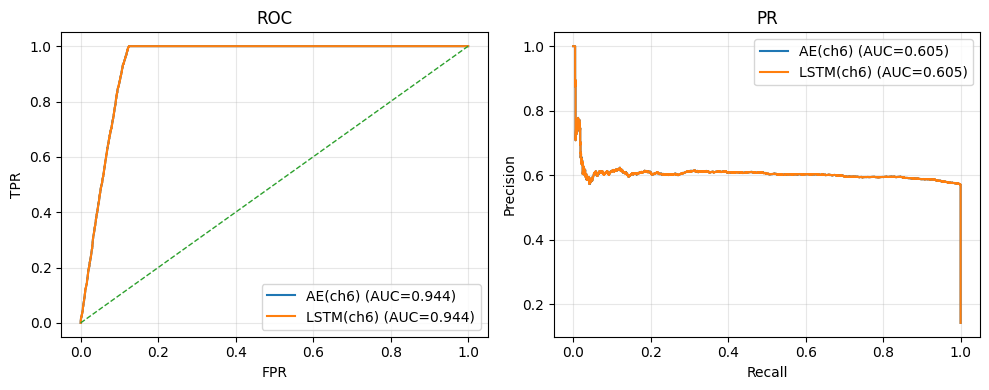

In [256]:
# Global
if used_mode in ("frac","any"):
    plot_roc_pr(y_true, Ea, El, "AE", "LSTM-AE")
    # recupere t_s do CSV misto para a timeline
    ts_mixed = mixed_df["t_s"].values
    plot_timeline(idx0, ts_mixed, y_true, Ea, El, yhat_ae, yhat_lstm)
else:
    # Per canal (ex.: perch_frac): escolhemos um canal pra inspecionar e também agregados micro
    Yc = y_true   # [Nwin,C]
    c = 5    # canal 6
    plot_roc_pr(Yc[:,c], Ea, El, f"AE(ch{c+1})", f"LSTM(ch{c+1})")


Vamos refinar o plot_timeline - usemos plotly para mais clareza

In [257]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

def window_time_centers(t_vector, idx0, W):
    """
    Retorna o tempo (mesma unidade de t_vector) correspondente ao centro de cada janela.
    t_vector: série original de tempo (len=T_total).
    idx0: índices de início das janelas (do make_windows).
    W: tamanho da janela (amostras).
    """
    centers = idx0 + (W//2)
    centers = np.clip(centers, 0, len(t_vector)-1)
    return np.asarray(t_vector)[centers]

def plot_recon_over_time(t_s, idx0, W, Ea, El, y_true=None, thr_ae=None, thr_lstm=None,
                         title="Reconstruction error over time"):
    """
    t_s   : vetor de tempo da série bruta (len=T_total)
    idx0  : inícios de janelas (do make_windows)
    W     : tamanho da janela
    Ea,El : arrays [Nwin] de erros (AE e LSTM-AE)
    y_true: [Nwin] rótulo binário por janela (opcional)
    thr_* : limiares para banda/linha (opcionais)
    """
    t_w = window_time_centers(t_s, idx0, W)

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                        row_heights=[0.8, 0.2], vertical_spacing=0.04,
                        subplot_titles=(title, "Rótulo (0/1)"))

    # Scores
    fig.add_trace(go.Scatter(x=t_w, y=Ea, name="AE MSE", mode="lines"), row=1, col=1)
    fig.add_trace(go.Scatter(x=t_w, y=El, name="LSTM-AE MSE", mode="lines"), row=1, col=1)

    # Limiar (se houver)
    if thr_ae is not None:
        fig.add_trace(go.Scatter(x=t_w, y=np.full_like(Ea, thr_ae), 
                                 name="thr AE", mode="lines", line=dict(dash="dash")), row=1, col=1)
    if thr_lstm is not None:
        fig.add_trace(go.Scatter(x=t_w, y=np.full_like(El, thr_lstm), 
                                 name="thr LSTM", mode="lines", line=dict(dash="dash")), row=1, col=1)

    # Linha de rótulo (faixa 0/1)
    if y_true is not None:
        fig.add_trace(go.Scatter(x=t_w, y=y_true, name="y_true", mode="lines", 
                                 line=dict(shape="hv")), row=2, col=1)

    fig.update_xaxes(title_text="tempo (h)", row=2, col=1)
    fig.update_yaxes(title_text="MSE", row=1, col=1)
    fig.update_yaxes(title_text="label", range=[-0.1, 1.1], row=2, col=1)
    fig.update_layout(template="plotly_white", legend=dict(orientation="h", yanchor="bottom", y=1.02, x=0))
    return fig

def plot_roc_pr_v2(y_true, scores_dict, titles=None):
    """
    y_true: [Nwin] binário.
    scores_dict: dict como {"AE": Ea, "LSTM-AE": El}
    """
    fig = make_subplots(rows=1, cols=2, subplot_titles=titles or ("ROC", "Precision-Recall"))

    # ROC
    for name, s in scores_dict.items():
        fpr, tpr, _ = roc_curve(y_true, s)
        roc_auc = auc(fpr, tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, name=f"ROC {name} (AUC={roc_auc:.2f})", mode="lines"),
                      row=1, col=1)
    fig.add_trace(go.Scatter(x=[0,1], y=[0,1], name="Azar", mode="lines", line=dict(dash="dash", color="gray")),
                  row=1, col=1)
    fig.update_xaxes(title="FPR", row=1, col=1); fig.update_yaxes(title="TPR", row=1, col=1)

    # PR
    for name, s in scores_dict.items():
        p, r, _ = precision_recall_curve(y_true, s)
        pr_auc = auc(r, p)
        fig.add_trace(go.Scatter(x=r, y=p, name=f"PR {name} (AUC={pr_auc:.2f})", mode="lines"),
                      row=1, col=2)
    fig.update_xaxes(title="Recall", row=1, col=2); fig.update_yaxes(title="Precision", row=1, col=2)

    fig.update_layout(template="plotly_white", legend=dict(orientation="h", yanchor="bottom", y=1.02, x=0))
    return fig

def plot_per_channel_heatmap(Yc, t_w, title="Drops por canal (janela × canal)"):
    """
    Yc: [Nwin, C] binário (1=janela com drop naquele canal)
    t_w: tempos centrais [Nwin]
    """
    fig = px.imshow(Yc.T, 
                    labels=dict(x="tempo (h)", y="canal", color="drop"),
                    x=[float(t) for t in t_w], 
                    y=[f"ch{c+1}" for c in range(Yc.shape[1])],
                    color_continuous_scale=["#f0f0f0", "#d62728"], # claro->vermelho
                    aspect="auto")
    fig.update_layout(title=title, template="plotly_white")
    return fig

def plot_channel_bars(ch_metrics, metrics=["auc_ae"], title=None):
    """
    ch_metrics: lista de dicts, cada um contendo 'channel' e métricas.
    metric: qual campo plotar (e.g., 'auc_ae', 'f1thr_lstm', etc.)
    """
    chans = [m["channel"] for m in ch_metrics]
    vals  = [[m.get(metric, np.nan) for metric in metrics] for m in ch_metrics]
    # plot a set of barplots, um por métrica
    fig = go.Figure()
    for i, metric in enumerate(metrics):
        fig.add_trace(go.Bar(
            x=chans,
            y=[vals[j][i] for j in range(len(chans))],
            name=metric
        ))
        # write values on top of bars
        fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
    fig.update_xaxes(title="canal")
    fig.update_yaxes(title=metrics[0] if len(metrics) == 1 else "value")
    fig.update_layout(title=title or f"{', '.join(metrics)} por canal", template="plotly_white")
    return fig

# Exemplo de uso das funções de plotagem com os resultados anteriores
if used_mode in ("frac","any"):
    y_true = Y
    fig1 = plot_roc_pr_v2(y_true, {"AE": Ea, "LSTM-AE": El})

    ts_mixed = mixed_df["t_s"].values
    fig2 = plot_recon_over_time(ts_mixed, idx0, W=60, Ea=Ea, El=El, y_true=y_true,
                               thr_ae=float(thr_ae), thr_lstm=float(thr_lstm),
                               title="Reconstruction Error over Time (Global Labels)")
else:
    Yc = y_true   # [Nwin,C]
    c = 5    # canal 6
    fig1 = plot_roc_pr_v2(Yc[:,c], {"AE": Ea, "LSTM-AE": El}, titles=(f"ROC (canal {c+1})", f"Precision-Recall (canal {c+1})"))

    ts_mixed = mixed_df["t_s"].values
    fig2 = plot_recon_over_time(ts_mixed, idx0, W=60, Ea=Ea, El=El, y_true=Yc[:,c],
                               thr_ae=float(thr_ae), thr_lstm=float(thr_lstm),
                               title=f"Reconstruction Error over Time (Channel {c+1} Labels)")

    t_w = window_time_centers(ts_mixed, idx0, W=60)
    fig3 = plot_per_channel_heatmap(Yc, t_w, title="Drops per Channel over Time")

    fig4 = plot_channel_bars(metrics["per_channel"], metrics=["auc_ae", "auc_lstm", "ap_ae", "ap_lstm", "f1max_ae", "f1max_lstm", "f1thr_ae", "f1thr_lstm"], title="Metrics per Channel")

In [258]:
fig1

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'mode': 'lines',
              'name': 'ROC AE (AUC=0.94)',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAAAAAAAAAAAAAAAAAAA' ... '1+Q03P7j91IK8sTNDuPwAAAAAAAPA/'),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': ('AAAAAAAAAAAWt2T0Q/Y3PzMg2HV793' ... 'AAAAAA8D8AAAAAAADwPwAAAAAAAPA/'),
                    'dtype': 'f8'},
              'yaxis': 'y'},
             {'mode': 'lines',
              'name': 'ROC LSTM-AE (AUC=0.94)',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAAAAAAAAAAAAAAAAAAA' ... 'pVNVrvPzJA2z40W+8/AAAAAAAA8D8='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': ('AAAAAAAAAAAWt2T0Q/Y3PzMg2HV793' ... 'AAAADwPwAAAAAAAPA/AAAAAAAA8D8='),
                    'dtype': 'f8'},
              'yaxis': 'y'},
             {'line': {'color': 'gray', 'dash': 'dash'},
              'mode': 'lines',
              'name': 'Azar',
              'type': 'scatter',
              'x': [0, 1],
              'xaxis': 'x',
              'y': [0, 1],
              'yaxis': 'y'},
             {'mode': 'lines',
              'name': 'PR AE (AUC=0.61)',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAA8D8AAAAAAADwPwAAAAAAAP' ... 'T0Q/ZHPxa3ZPRD9jc/AAAAAAAAAAA='),
                    'dtype': 'f8'},
              'xaxis': 'x2',
              'y': {'bdata': ('zM0Gumg+wj+AzKgJpz7CP3d19FrlPs' ... 'AAAADwPwAAAAAAAPA/AAAAAAAA8D8='),
                    'dtype': 'f8'},
              'yaxis': 'y2'},
             {'mode': 'lines',
              'name': 'PR LSTM-AE (AUC=0.61)',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAA8D8AAAAAAADwPwAAAAAAAP' ... 'RD9kc/Frdk9EP2Nz8AAAAAAAAAAA=='),
                    'dtype': 'f8'},
              'xaxis': 'x2',
              'y': {'bdata': ('zM0Gumg+wj+AzKgJpz7CP3d19FrlPs' ... 'AAAPA/AAAAAAAA8D8AAAAAAADwPw=='),
                    'dtype': 'f8'},
              'yaxis': 'y2'}],
    'layout': {'annotations': [{'font': {'size': 16},
                                'showarrow': False,
                                'text': 'ROC (canal 6)',
                                'x': 0.225,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'},
                               {'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Precision-Recall (canal 6)',
                                'x': 0.775,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'}],
               'legend': {'orientation': 'h', 'x': 0, 'y': 1.02, 'yanchor': 'bottom'},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 0.45], 'title': {'text': 'FPR'}},
               'xaxis2': {'anchor': 'y2', 'domain': [0.55, 1.0], 'title': {'text': 'Recall'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'TPR'}},
               'yaxis2': {'anchor': 'x2', 'domain': [0.0, 1.0], 'title': {'text': 'Precision'}}}
})

In [259]:
fig4

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'name': 'auc_ae',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.9685717806943109, 0.9430343928989338, 0.9324672200767536,
                    0.9397994178177708, 0.9538625232764368, 0.9438719079216802,
                    0.9651932077163655, 0.9395117350806389, 0.9350560274392249,
                    0.9424732635534306, 0.9569236231399486, 0.9333591990533369]},
             {'name': 'auc_lstm',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.9685698292902725, 0.9430370040760593, 0.9324662862283601,
                    0.9398004334642034, 0.9538651430286301, 0.9438712968335188,
                    0.9651919467369501, 0.939510071518106, 0.9350553020360125,
                    0.9424719620333936, 0.956921979328229, 0.9333598865864651]},
             {'name': 'ap_ae',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.7718142529484924, 0.6112424602184798, 0.5296822120143183,
                    0.5765817058463979, 0.6475106195969516, 0.6056244558743029,
                    0.7633308805644492, 0.5928921126826467, 0.5531030678714012,
                    0.5939352647576334, 0.7011707876918725, 0.5408725901565046]},
             {'name': 'ap_lstm',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.7717801500464041, 0.6112771332602243, 0.5296818883518173,
                    0.5765847730571392, 0.6475275318787208, 0.6056149390558787,
                    0.7633057657414268, 0.5928919413935054, 0.5531037082766932,
                    0.5939187237347359, 0.7011658047039571, 0.5408849640874864]},
             {'name': 'f1max_ae',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.7635273702471848, 0.6884752258413223, 0.7062474699766043,
                    0.7126900820880891, 0.6895041451582965, 0.7283686043392089,
                    0.7444717444712594, 0.7279245784087788, 0.6731146621806556,
                    0.7087814840022639, 0.7271713369575666, 0.683310344827136]},
             {'name': 'f1max_lstm',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.7635273702471848, 0.6884752258413223, 0.7062474699766043,
                    0.7126900820880891, 0.689633573441433, 0.7283686043392089,
                    0.744664517119122, 0.7279245784087788, 0.6731980405873751,
                    0.7087814840022639, 0.7271966527191946, 0.683310344827136]},
             {'name': 'f1thr_ae',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.7067491119584954, 0.6769851951543298, 0.6949017525221167,
                    0.7004230565833627, 0.6607629427788488, 0.7150326797381024,
                    0.7077691599837674, 0.7160397074185577, 0.6609453752890273,
                    0.6954213669537599, 0.7114956088604668, 0.6709031909135614]},
             {'name': 'f1thr_lstm',
              'textposition': 'outside',
              'texttemplate': '%{y:.2f}',
              'type': 'bar',
              'x': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
              'y': [0.7080532489780582, 0.6782632146705332, 0.6961957967540019,
                 

In [260]:
if used_mode.startswith('perch_'):
    # deve bater com p_drop do dataset, aproximadamente, caso seja perch_any:
    print(y_true[:,10].sum())
    print(len(y_true[:,10]))
    print(y_true[:,10].sum() / len(y_true[:,10])) # vai variando o segundo índice de 0 a 11

2714
19189
0.14143519724842357


In [261]:
yhat_ae.sum() / len(yhat_ae)

np.float64(0.25613632810464326)

In [262]:
yhat_lstm.sum() / len(yhat_lstm)

np.float64(0.2554067434467664)

In [263]:
# plot attack_df_3.t_s vs yhat_lstm
# dá erro pois yhat_lstm tem dimensão 0 igual a Nwin, que é menor que len(attack_df_3)

# import matplotlib.pyplot as plt

# plt.figure(figsize=(12, 6))
# plt.plot(attack_df_3["t_s"], yhat_lstm, label="LSTM Predictions")
# plt.xlabel("Time (s)")
# plt.ylabel("LSTM Output")
# plt.title("LSTM Predictions over Time")
# plt.legend()
# plt.show()

In [264]:
y_true.shape

(19189, 12)

In [265]:
yhat_lstm.shape

(19189,)

In [266]:
# façamos uma transformação de volta para nível amostras:
def windows_to_samples(idx0, W, T, values,
                       reduce_time="max",      # "max" ou "mean" no eixo do tempo
                       per_channel=False,      # True: retorna [T, C]; False: retorna [T]
                       agg_channels="any"):    # se values for [Nwin, C] e per_channel=False: "any"|"mean"
    """
    idx0: inícios de janela (array [Nwin])
    W: tamanho da janela (int)
    T: nº total de amostras do sinal original (int)
    values: [Nwin] ou [Nwin, C]
    """
    values = np.asarray(values)
    assert reduce_time in ("max","mean")
    if values.ndim == 1:
        # ----- caso [Nwin] -----
        arr = np.zeros(T, dtype=float)
        cnt = np.zeros(T, dtype=int)
        for i, s in enumerate(idx0):
            e = min(s+W, T)
            if reduce_time == "max":
                arr[s:e] = np.maximum(arr[s:e], values[i])
                cnt[s:e] = 1
            else:  # mean
                arr[s:e] += values[i]
                cnt[s:e] += 1
        if reduce_time == "mean":
            cnt[cnt==0] = 1
            arr = arr / cnt
        return arr

    # ----- caso [Nwin, C] -----
    Nwin, C = values.shape
    if per_channel:
        # devolve [T, C]
        arr = np.zeros((T, C), dtype=float)
        cnt = np.zeros((T, C), dtype=int)
        for i, s in enumerate(idx0):
            e = min(s+W, T)
            if reduce_time == "max":
                # broadcasting [W, C] com [C] via None
                arr[s:e, :] = np.maximum(arr[s:e, :], values[i][None, :])
                cnt[s:e, :] = 1
            else:  # mean
                arr[s:e, :] += values[i][None, :]
                cnt[s:e, :] += 1
        if reduce_time == "mean":
            cnt[cnt==0] = 1
            arr = arr / cnt
        return arr
    else:
        # agrega canais por janela para um escalar e recursiona
        if   agg_channels == "any":   v1 = values.max(axis=1)
        elif agg_channels == "mean":  v1 = values.mean(axis=1)
        else: raise ValueError("agg_channels deve ser 'any' ou 'mean'")
        return windows_to_samples(idx0, W, T, v1, reduce_time=reduce_time)


# exemplo: expandir alarmes binários e scores
T = len(mixed_df["t_s"])
ae_alarm_samples   = windows_to_samples(idx0, W, T, yhat_ae.astype(float), reduce_time="max").astype(int)
lstm_alarm_samples = windows_to_samples(idx0, W, T, yhat_lstm.astype(float), reduce_time="max").astype(int)
# rótulo global por amostra:
global_y_true_samples = windows_to_samples(idx0, W, T, y_true,
                                    reduce_time="max",
                                    per_channel=False,   # retorna [T]
                                    agg_channels="any")  # drop em qualquer canal -> 1
# rótulo por canal por amostra:
if used_mode.startswith("perch_"):
    perch_y_true_samples = windows_to_samples(idx0, W, T, y_true,
                                        reduce_time="max",
                                        per_channel=True)   # retorna [T, C]
Ea_samples         = windows_to_samples(idx0, W, T, Ea, reduce_time="mean")
El_samples         = windows_to_samples(idx0, W, T, El, reduce_time="mean")


In [267]:
y_true.shape

(19189, 12)

In [268]:
perch_y_true_samples.shape

(96002, 12)

In [269]:
lstm_alarm_samples.shape

(96002,)

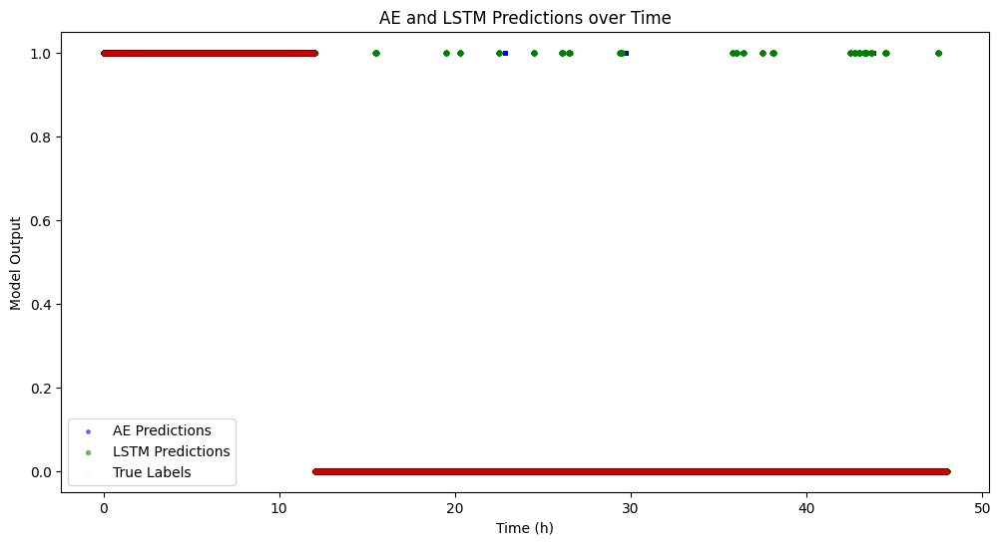

In [270]:
# agora sim, plotemos yhat_lstm ao longo do tempo
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.scatter(mixed_df["t_s"], ae_alarm_samples, label="AE Predictions", color='blue', alpha=0.5, s=6)
plt.scatter(mixed_df["t_s"], lstm_alarm_samples, label="LSTM Predictions", color='green', alpha=0.5, s = 8)
# add global y_true_samples as red dots
plt.scatter(mixed_df["t_s"], global_y_true_samples, label="True Labels", color='red', alpha=0.02, s = 10)
plt.xlabel("Time (h)")
plt.ylabel("Model Output")
plt.title("AE and LSTM Predictions over Time")
plt.legend()
plt.show()

In [182]:
# # make the same plot as before, but using plotly
# import plotly.graph_objects as go
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=mixed_df["t_s"], y=ae_alarm_samples,
#                          mode='markers', name='AE Predictions',
#                          marker=dict(color='blue', size=6, opacity=0.5)))
# fig.add_trace(go.Scatter(x=mixed_df["t_s"], y=lstm_alarm_samples,
#                          mode='markers', name='LSTM Predictions',
#                          marker=dict(color='green', size=8, opacity=0.5)))
# fig.add_trace(go.Scatter(x=mixed_df["t_s"], y=global_y_true_samples,
#                          mode='markers', name='True Labels',
#                          marker=dict(color='red', size=10, opacity=0.02)))
# fig.update_layout(title='AE and LSTM Predictions over Time',
#                   xaxis_title='Time (h)',
#                   yaxis_title='Model Output')

In [271]:
def _runs_to_spans_binary(y, t):
    y = np.asarray(y).astype(int)
    t = np.asarray(t)
    if len(y)==0: return []
    dy = np.diff(np.r_[0, y, 0])
    starts = np.where(dy== 1)[0]
    ends   = np.where(dy==-1)[0]
    return [(t[s], t[e-1]) for s,e in zip(starts, ends)]

# --- timeline em Plotly (nível amostra)
def plot_timeline_plotly_samples(
    t_s,
    Ea, El,                       # scores: podem ser [T] (amostra) OU [Nwin] (janela)
    y_true_samples=None,          # [T] (0/1)
    ae_alarm_samples=None,        # [T] (0/1)
    lstm_alarm_samples=None,      # [T] (0/1)
    thr_ae=None, thr_lstm=None,  # limiares
    idx0=None, W=None,            # obrigatórios apenas se Ea/El vierem em nível janela
    mode="robust",                # "robust" (1–99%) ou "log"
    resample=None                 # e.g. "30s", "1min" (usa pandas resample)
):
    t_s = np.asarray(t_s)
    T   = len(t_s)

    # -> garantir que scores estejam na granularidade de amostra
    def _maybe_to_samples(score):
        s = np.asarray(score)
        if len(s)==T:
            return s.astype(float)
        if idx0 is None or W is None:
            raise ValueError("Ea/El parecem estar por janela; forneça idx0 e W para reamostrar.")
        return windows_to_samples(idx0, W, T, s, reduce_time="mean")

    Ea_s = _maybe_to_samples(Ea)
    El_s = _maybe_to_samples(El)

    # Opcional: reamostrar no tempo
    def _maybe_resample(series_1d):
        if series_1d is None: return None, None
        s = pd.Series(series_1d, index=pd.to_timedelta(t_s, unit="h"))
        s = s.resample(resample).median()
        new_t = s.index.total_seconds()/3600.0
        return s.values, new_t

    if resample:
        Ea_s, t_rs = _maybe_resample(Ea_s)
        El_s, _    = _maybe_resample(El_s)
        if y_true_samples is not None:
            y_true_samples, _    = _maybe_resample(np.asarray(y_true_samples).astype(int))
            y_true_samples       = (y_true_samples>0).astype(int)
        if ae_alarm_samples is not None:
            ae_alarm_samples, _  = _maybe_resample(np.asarray(ae_alarm_samples).astype(int))
            ae_alarm_samples     = (ae_alarm_samples>0).astype(int)
        if lstm_alarm_samples is not None:
            lstm_alarm_samples,_ = _maybe_resample(np.asarray(lstm_alarm_samples).astype(int))
            lstm_alarm_samples   = (lstm_alarm_samples>0).astype(int)
        t_plot = t_rs
    else:
        t_plot = t_s

    # Escalonamento visual dos scores
    if mode == "log":
        Ea_plot = np.log10(np.maximum(Ea_s, 1e-12))
        El_plot = np.log10(np.maximum(El_s, 1e-12))
        ytitle  = "log10(score)"
    else:
        def robust_scale(x):
            lo, hi = np.nanpercentile(x, [1,99]) # extrai 1% e 99%
            return (x-lo)/max(hi-lo, 1e-12) # divide por range de percentis para evitar explosão de escala
        Ea_plot = robust_scale(Ea_s)
        El_plot = robust_scale(El_s)
        ytitle  = "score (robust scaled)"

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                        row_heights=[0.65, 0.35], vertical_spacing=0.06,
                        subplot_titles=("Scores", "Rótulos e alarmes"))

    # sombrear regiões com label=1
    if y_true_samples is not None:
        spans = _runs_to_spans_binary(y_true_samples, t_plot)
        for a,b in spans:
            for r in (1,2):
                fig.add_vrect(x0=a, x1=b, row=r, col=1,
                              fillcolor="rgba(255,0,0,0.12)", line_width=0)

    # scores
    fig.add_trace(go.Scatter(x=t_plot, y=Ea_plot, name="AE score",   mode="lines"), row=1, col=1)
    fig.add_trace(go.Scatter(x=t_plot, y=El_plot, name="LSTM score", mode="lines"), row=1, col=1)

    # linha binária label / marcadores de alarme
    if y_true_samples is not None:
        fig.add_trace(go.Scatter(x=t_plot, y=y_true_samples, name="label",
                                 mode="lines", line=dict(shape="hv")), row=2, col=1)
    if ae_alarm_samples is not None:
        ta = t_plot[np.asarray(ae_alarm_samples)==1]
        fig.add_trace(go.Scatter(x=ta, y=np.ones_like(ta)*1.02, name="AE alarm",
                                 mode="markers", marker=dict(symbol="triangle-up", size=8)), row=2, col=1)
    if lstm_alarm_samples is not None:
        tl = t_plot[np.asarray(lstm_alarm_samples)==1]
        fig.add_trace(go.Scatter(x=tl, y=np.ones_like(tl)*0.85, name="LSTM alarm",
                                 mode="markers", marker=dict(symbol="x", size=8)), row=2, col=1)
        
    # Adiciona linhas de limiar se fornecidas
    if thr_ae is not None:
        fig.add_hline(y=thr_ae, line_dash="dash", line_color="blue", row=2, col=1, annotation_text=f"AE thr = {round(thr_ae,2)}", annotation_position="top left", name="AE Threshold")
    if thr_lstm is not None:
        fig.add_hline(y=thr_lstm, line_dash="dash", line_color="orange", row=2, col=1, annotation_text=f"LSTM thr = {round(thr_lstm,2)}", annotation_position="bottom left", name="LSTM Threshold")

    fig.update_yaxes(title_text=ytitle, row=1, col=1)
    fig.update_yaxes(title_text="label / alarmes", range=[-0.1, 1.2], row=2, col=1)
    fig.update_xaxes(title_text="tempo (h)", row=2, col=1)
    fig.update_layout(template="plotly_white", title="Timeline: scores, rótulos e alarmes",
                      legend=dict(orientation="h", yanchor="bottom", y=1.02, x=0))
    return fig

In [273]:
# Se seus scores ainda estão por janela:
fig = plot_timeline_plotly_samples(
    t_s=mixed_df["t_s"].values,
    Ea=Ea, El=El,              # [Nwin] (a função converte)
    y_true_samples=global_y_true_samples,               # [T]
    ae_alarm_samples=ae_alarm_samples,           # [T]
    lstm_alarm_samples=lstm_alarm_samples,       # [T]
    thr_ae=float(thr_ae), thr_lstm=float(thr_lstm),
    idx0=idx0, W=W,                              # necessários p/ converter scores
    mode="robust",
    resample=None
)

In [274]:
fig

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'mode': 'lines',
              'name': 'AE score',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAqvHSTWJAPwCq8dJNYl' ... '3v/0dABgAAAAAASED40k1iEABIQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': ('AKirjcTA7D8AqKuNxMDsPwCoq43EwO' ... 'YCOGA6MbdC7wZMXroxt0LvBkxeug=='),
                    'dtype': 'f8'},
              'yaxis': 'y'},
             {'mode': 'lines',
              'name': 'LSTM score',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAqvHSTWJAPwCq8dJNYl' ... '3v/0dABgAAAAAASED40k1iEABIQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'y': {'bdata': ('ueuQiuu/7D+565CK67/sP7nrkIrrv+' ... '1/C0o6mFuvGvJ4W7qYW68a8nhbug=='),
                    'dtype': 'f8'},
              'yaxis': 'y'},
             {'line': {'shape': 'hv'},
              'mode': 'lines',
              'name': 'label',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAqvHSTWJAPwCq8dJNYl' ... '3v/0dABgAAAAAASED40k1iEABIQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x2',
              'y': {'bdata': ('AAAAAAAA8D8AAAAAAADwPwAAAAAAAP' ... 'AAAAAAAAAAAAAAAAAAAAAAAAAAAA=='),
                    'dtype': 'f8'},
              'yaxis': 'y2'},
             {'marker': {'size': 8, 'symbol': 'triangle-up'},
              'mode': 'markers',
              'name': 'AE alarm',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAqvHSTWJAPwCq8dJNYl' ... 'pJDEJGQCwxCKwcQkZAHgRWDi1CRkA='),
                    'dtype': 'f8'},
              'xaxis': 'x2',
              'y': {'bdata': ('UrgehetR8D9SuB6F61HwP1K4HoXrUf' ... '6F61HwP1K4HoXrUfA/UrgehetR8D8='),
                    'dtype': 'f8'},
              'yaxis': 'y2'},
             {'marker': {'size': 8, 'symbol': 'x'},
              'mode': 'markers',
              'name': 'LSTM alarm',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAAAqvHSTWJAPwCq8dJNYl' ... 'w/NV7CR0DlT42XbsJHQNci2/l+wkdA'),
                    'dtype': 'f8'},
              'xaxis': 'x2',
              'y': {'bdata': ('MzMzMzMz6z8zMzMzMzPrPzMzMzMzM+' ... 'MzMzMz6z8zMzMzMzPrPzMzMzMzM+s/'),
                    'dtype': 'f8'},
              'yaxis': 'y2'}],
    'layout': {'annotations': [{'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Scores',
                                'x': 0.5,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 1.0,
                                'yanchor': 'bottom',
                                'yref': 'paper'},
                               {'font': {'size': 16},
                                'showarrow': False,
                                'text': 'Rótulos e alarmes',
                                'x': 0.5,
                                'xanchor': 'center',
                                'xref': 'paper',
                                'y': 0.32899999999999996,
                                'yanchor': 'bottom',
                                'yref': 'paper'},
                               {'showarrow': False,
                                'text': 'AE thr = 0.55',
                                'x': 0,
                                'xanchor': 'left',
                                'xref': 'x2 domain',
                                'y': 0.5512121319770813,
                                'yanchor': 'bottom',
                                'yref': 'y2'},
                               {'showarrow': False,
                                'text': 'LSTM thr = 0.41',
                                'x': 0,
                                'xanchor': 'left',
                                'xref': 'x2 domain',
                                'y': 0.40865612030029297,
                               

In [98]:
# confusion matrices heatmaps
import plotly.figure_factory as ff
def plot_confusion_matrix(cm, title="Confusion Matrix"):
    z = cm
    x = ["Pred 0", "Pred 1"]
    y = ["True 0", "True 1"]
    z_text = [[str(y) for y in x] for x in z]

    fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='Blues')
    fig.update_layout(title=title, template="plotly_white")
    fig.update_xaxes(title="Predicted Label")
    fig.update_yaxes(title="True Label")
    return fig

In [275]:
# confusion matrix for AE
from sklearn.metrics import confusion_matrix
cm_ae = confusion_matrix(global_y_true_samples, ae_alarm_samples)
print(cm_ae) # (0,0) = TN, (0,1) = FP, (1,0) = FN, (1,1) = TP
cm_lstm = confusion_matrix(global_y_true_samples, lstm_alarm_samples)
print(cm_lstm) # (0,0) = TN, (0,1) = FP, (1,0) = FN, (1,1) = TP

[[70462  1515]
 [    0 24025]]
[[70232  1745]
 [    0 24025]]


In [276]:
plot_confusion_matrix(cm_ae, title="Confusion Matrix - AE")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'colorscale': [[0.0, 'rgb(247,251,255)'], [0.125,
                             'rgb(222,235,247)'], [0.25, 'rgb(198,219,239)'],
                             [0.375, 'rgb(158,202,225)'], [0.5,
                             'rgb(107,174,214)'], [0.625, 'rgb(66,146,198)'],
                             [0.75, 'rgb(33,113,181)'], [0.875, 'rgb(8,81,156)'],
                             [1.0, 'rgb(8,48,107)']],
              'reversescale': False,
              'showscale': False,
              'type': 'heatmap',
              'x': [Pred 0, Pred 1],
              'y': [True 0, True 1],
              'z': {'bdata': 'PhMBAOsFAAAAAAAA2V0AAA==', 'dtype': 'i4', 'shape': '2, 2'}}],
    'layout': {'annotations': [{'font': {'color': '#FFFFFF'},
                                'showarrow': False,
                                'text': '70462',
                                'x': 'Pred 0',
                                'xref': 'x',
                                'y': 'True 0',
                                'yref': 'y'},
                               {'font': {'color': '#000000'},
                                'showarrow': False,
                                'text': '1515',
                                'x': 'Pred 1',
                                'xref': 'x',
                                'y': 'True 0',
                                'yref': 'y'},
                               {'font': {'color': '#000000'},
                                'showarrow': False,
                                'text': '0',
                                'x': 'Pred 0',
                                'xref': 'x',
                                'y': 'True 1',
                                'yref': 'y'},
                               {'font': {'color': '#000000'},
                                'showarrow': False,
                                'text': '24025',
                                'x': 'Pred 1',
                                'xref': 'x',
                                'y': 'True 1',
                                'yref': 'y'}],
               'template': '...',
               'title': {'text': 'Confusion Matrix - AE'},
               'xaxis': {'dtick': 1,
                         'gridcolor': 'rgb(0, 0, 0)',
                         'side': 'top',
                         'ticks': '',
                         'title': {'text': 'Predicted Label'}},
               'yaxis': {'dtick': 1, 'ticks': '', 'ticksuffix': '  ', 'title': {'text': 'True Label'}}}
})

In [277]:
plot_confusion_matrix(cm_lstm, title="Confusion Matrix - LSTM-AE")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'colorscale': [[0.0, 'rgb(247,251,255)'], [0.125,
                             'rgb(222,235,247)'], [0.25, 'rgb(198,219,239)'],
                             [0.375, 'rgb(158,202,225)'], [0.5,
                             'rgb(107,174,214)'], [0.625, 'rgb(66,146,198)'],
                             [0.75, 'rgb(33,113,181)'], [0.875, 'rgb(8,81,156)'],
                             [1.0, 'rgb(8,48,107)']],
              'reversescale': False,
              'showscale': False,
              'type': 'heatmap',
              'x': [Pred 0, Pred 1],
              'y': [True 0, True 1],
              'z': {'bdata': 'WBIBANEGAAAAAAAA2V0AAA==', 'dtype': 'i4', 'shape': '2, 2'}}],
    'layout': {'annotations': [{'font': {'color': '#FFFFFF'},
                                'showarrow': False,
                                'text': '70232',
                                'x': 'Pred 0',
                                'xref': 'x',
                                'y': 'True 0',
                                'yref': 'y'},
                               {'font': {'color': '#000000'},
                                'showarrow': False,
                                'text': '1745',
                                'x': 'Pred 1',
                                'xref': 'x',
                                'y': 'True 0',
                                'yref': 'y'},
                               {'font': {'color': '#000000'},
                                'showarrow': False,
                                'text': '0',
                                'x': 'Pred 0',
                                'xref': 'x',
                                'y': 'True 1',
                                'yref': 'y'},
                               {'font': {'color': '#000000'},
                                'showarrow': False,
                                'text': '24025',
                                'x': 'Pred 1',
                                'xref': 'x',
                                'y': 'True 1',
                                'yref': 'y'}],
               'template': '...',
               'title': {'text': 'Confusion Matrix - LSTM-AE'},
               'xaxis': {'dtick': 1,
                         'gridcolor': 'rgb(0, 0, 0)',
                         'side': 'top',
                         'ticks': '',
                         'title': {'text': 'Predicted Label'}},
               'yaxis': {'dtick': 1, 'ticks': '', 'ticksuffix': '  ', 'title': {'text': 'True Label'}}}
})

In [278]:
# Calculate precision and recall
from sklearn.metrics import precision_score, recall_score
precision_ae = precision_score(global_y_true_samples, ae_alarm_samples)
recall_ae = recall_score(global_y_true_samples, ae_alarm_samples)
precision_lstm = precision_score(global_y_true_samples, lstm_alarm_samples)
recall_lstm = recall_score(global_y_true_samples, lstm_alarm_samples)

In [279]:
print(f"AE - Precision: {precision_ae:.4f}, Recall: {recall_ae:.4f}")
print(f"LSTM - Precision: {precision_lstm:.4f}, Recall: {recall_lstm:.4f}")

AE - Precision: 0.9407, Recall: 1.0000
LSTM - Precision: 0.9323, Recall: 1.0000
